# <font color='dodgerblue'> Object Detection with Detectron and YOLO

## <font color='Orange'> Problem defining:

### <font color='Orange'> - Object detection can be instrumental for computer vision applications in medical imaging and self-driving cars.

### <font color='Orange'> - Here we use two pretrained open-source modules to showcase automatic recogonition of objects in image or video analysis.

#### <font color='dodgerblue'>1. Detectron Model; 2. Loading Image and Pretrained Model; 3. Visualize Prediction; 4. Additional Image Predictions; 5. Keypoint; 6. Panoptic; 7. YOLO


# 1. The model behind Detectron


Many pretrained models can be found back within the "[modelzoo](https://github.com/facebookresearch/detectron2/blob/master/MODEL_ZOO.md)". This is a collection of models pretrained on a certain dataset that are ready to be used. Mostly people will use the pretrained weights of these model for initalization of there own custom model. This significantly shortens the training time and performance. And that's exactly what we'll be doing!

The model we'll be using can be found [here](https://github.com/facebookresearch/detectron2/blob/master/configs/COCO-Detection/retinanet_R_50_FPN_3x.yaml). 

How does it work?
(https://www.researchgate.net/figure/Our-Mask-R-CNN-framework-In-the-first-stage-we-use-Resnet50-Resnet101-and-Resnet_fig1_334011187):
Region proposal network (RPN) utilizes feature maps at one of the intermediate layers (usually the last convolutional layer) of the CNN feature extractor networks to generate box proposals (300 boxes in our study). The proposed boxes are a grid of anchors tiled in different aspect ratios and scales. The second stage predicts the confidence value, the offsets for the proposed box and the mask within the box for each anchor.
Source publication

![Mask R-CNN Resnet](https://www.researchgate.net/profile/Hemin_Ali_Qadir/publication/334011187/figure/fig1/AS:774289183735808@1561616335154/Our-Mask-R-CNN-framework-In-the-first-stage-we-use-Resnet50-Resnet101-and-Resnet.ppm)

Alright, so now that we know how our model works lets test it out!

In [1]:
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu102/torch1.7/index.html

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu102/torch1.7/index.html
     |████████████████████████████████| 6.1 MB 529 kB/s eta 0:00:01
     |████████████████████████████████| 151 kB 386 kB/s eta 0:00:01
     |████████████████████████████████| 130 kB 2.0 MB/s eta 0:00:01
     |████████████████████████████████| 50 kB 2.2 MB/s eta 0:00:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 79 kB 2.2 MB/s eta 0:00:01
     |████████████████████████████████| 117 kB 2.6 MB/s eta 0:00:01
  Created wheel for fvcore: filename=fvcore-0.1.5.post20221122-py3-none-any.whl size=61479 sha256=f4959d2044abaccbc49ce35fc8ae8f9e2dbc6277fbe5b2ec9a36a30e9e8bba8d
  Stored in directory: /root/.cache/pip/wheels/2d/e4/d7/be0b4010933f5fffea6385e9b319eac9d6e56c82ee4a0164e5
  Created wheel for antlr4-python3-runtime: filename=antlr4_python3_runtime-4.9.3-py3-none-any.whl size=1

In [2]:
# Base setup:
# detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# common libraries
import numpy as np
import os, json, cv2, random
import matplotlib.pyplot as plt
%matplotlib inline

# detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.structures import BoxMode

<a id="loadmodel" ></a>
# 2. Loading image and using a pretrained model for Detectron

The model we'll be using is pretrained on the [COCO](https://cocodataset.org/#home) dataset (2017). This dataset contains a lot of labeled data people can use to train there Object detection models on. (Object, Keypoint, Panoptic, Instance and Densepose detectors) 

Let's take a look at a sample:

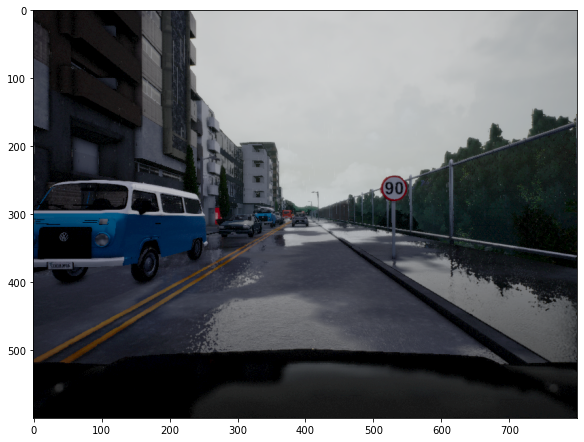

In [3]:
#!wget http://images.cocodataset.org/val2017/000000282037.jpg -q -O input.jpg
im = cv2.imread("/kaggle/input/lyft-udacity-challenge/dataA/dataA/CameraRGB/02_00_120.png")

plt.figure(figsize=(15,7.5))
plt.imshow(im[..., ::-1]) #bgr to rgb

In [46]:
import warnings
warnings.filterwarnings('ignore')

In this first "coding" part are two important utils from Detector2. On the one hand we are using **cfg** or better [configs](https://detectron2.readthedocs.io/en/latest/tutorials/configs.html) which represents the complete configuration of a object detection model. These configurations are stored within a YAML-file and can be easily received from the modelzoo.

After the configuration is complete we'll use the [**DefaultPredictor**](https://detectron2.readthedocs.io/en/latest/tutorials/models.html?highlight=DefaultPredictor#use-a-model) class to make predictions.

In [47]:
cfg = get_cfg()

cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model

cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
predictor = DefaultPredictor(cfg)
outputs = predictor(im[..., ::-1])        ####<------ Predic image segmentation  ##################

The output of the predictions is saved within the outputs variable. See [model output format](https://detectron2.readthedocs.io/tutorials/models.html#model-output-format) for all the available functions. 

In [5]:
print(outputs["instances"].pred_classes)
# print(outputs["instances"].pred_boxes)

tensor([2, 2, 2], device='cuda:0')


In the output above we see an array which shows us the predictions made by the model. But what number stands for which class?

Every dataset is associated with [metadata](https://detectron2.readthedocs.io/en/latest/tutorials/datasets.html#metadata-for-datasets). It is a key-value mapping that contains information about the dataset. It can be used to further interpret the dataset. This information can later be used for data augmentation, evaluation, visualization, logging, ... .

In [6]:
MetadataCatalog.get(cfg.DATASETS.TRAIN[0])

namespace(name='coco_2017_train',
          json_file='datasets/coco/annotations/instances_train2017.json',
          image_root='datasets/coco/train2017',
          evaluator_type='coco',
          thing_dataset_id_to_contiguous_id={1: 0,
                                             2: 1,
                                             3: 2,
                                             4: 3,
                                             5: 4,
                                             6: 5,
                                             7: 6,
                                             8: 7,
                                             9: 8,
                                             10: 9,
                                             11: 10,
                                             13: 11,
                                             14: 12,
                                             15: 13,
                                             16: 14,
                                   

For example you can find which objects it can recognize:

In [7]:
import pandas as pd
modelclasses = MetadataCatalog.get(cfg.DATASETS.TRAIN[0]).thing_classes
df = pd.DataFrame(modelclasses,columns=['Model classes'])
df.head()

,Model classes
0,person
1,bicycle
2,car
3,motorcycle
4,airplane


Now that we know each label through the metadata. Let's visualize the result of the pretrained model from the modelzoo. For this we'll use the [**Visualizer**](https://detectron2.readthedocs.io/en/latest/modules/utils.html#module-detectron2.utils.visualizer) class.

# 3. Visualize the predicted image from Detectron

In [8]:
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

Text(0.5, 1.0, 'Original')

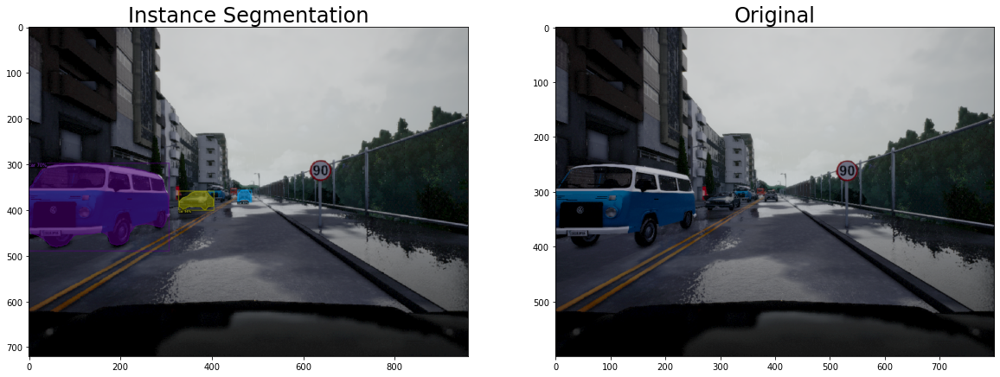

In [9]:
fig, arr = plt.subplots(1, 2, figsize=(20, 8))

arr[0].imshow(out.get_image()[..., ::-1][..., ::-1])
arr[0].set_title('Instance Segmentation',fontsize=24)

arr[1].imshow(im[..., ::-1])
arr[1].set_title('Original',fontsize=24)

# 4. Additional Images for Detectron Prediction

Text(0.5, 1.0, 'Original')

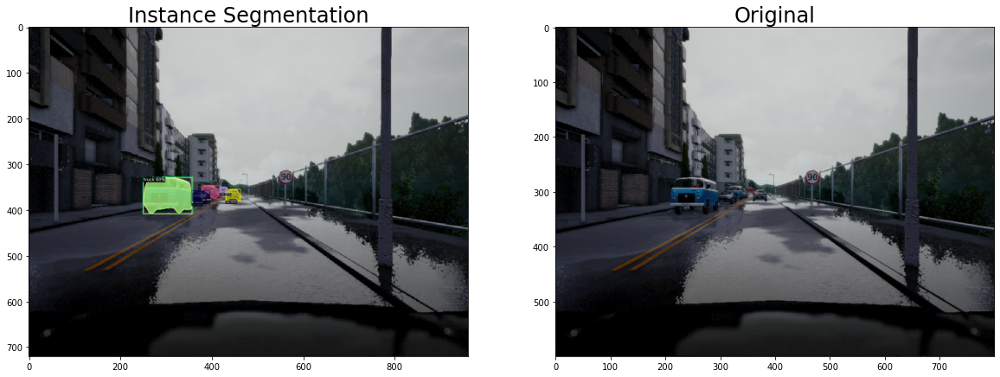

In [10]:
im = cv2.imread("/kaggle/input/lyft-udacity-challenge/dataC/dataC/CameraRGB/02_00_114.png")

outputs = predictor(im[..., ::-1]) 
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

fig, arr = plt.subplots(1, 2, figsize=(20, 8))

arr[0].imshow(out.get_image()[..., ::-1][..., ::-1])
arr[0].set_title('Instance Segmentation',fontsize=24)

arr[1].imshow(im[..., ::-1])
arr[1].set_title('Original',fontsize=24)

Text(0.5, 1.0, 'Original')

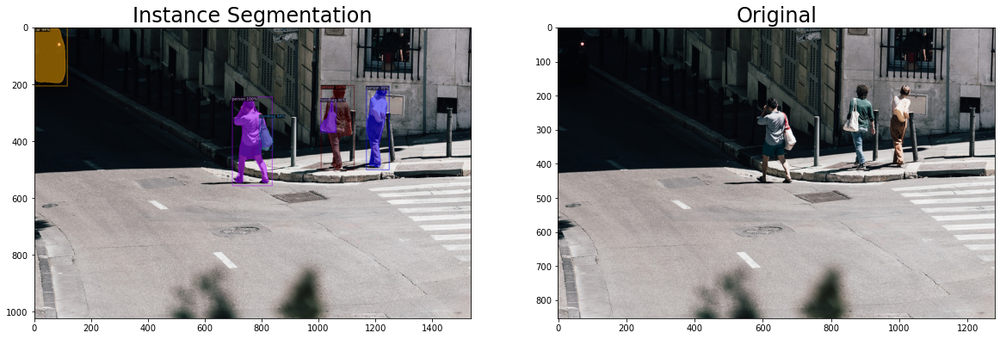

In [11]:
im = cv2.imread("/kaggle/input/street/pedestrian-7359030_1280.jpg")

outputs = predictor(im[..., ::-1]) 
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

fig, arr = plt.subplots(1, 2, figsize=(20, 8))

arr[0].imshow(out.get_image()[..., ::-1][..., ::-1])
arr[0].set_title('Instance Segmentation',fontsize=24)

arr[1].imshow(im[..., ::-1])
arr[1].set_title('Original',fontsize=24)

# 5. Keypoint detection

Reload the data.

In [12]:
#!wget http://images.cocodataset.org/val2017/000000282037.jpg -q -O input.jpg
im_key = cv2.imread("/kaggle/input/street/pedestrian-7359030_1280.jpg")        #############

model_final_a6e10b.pkl: 237MB [00:15, 15.3MB/s]                              


Text(0.5, 1.0, 'Original')

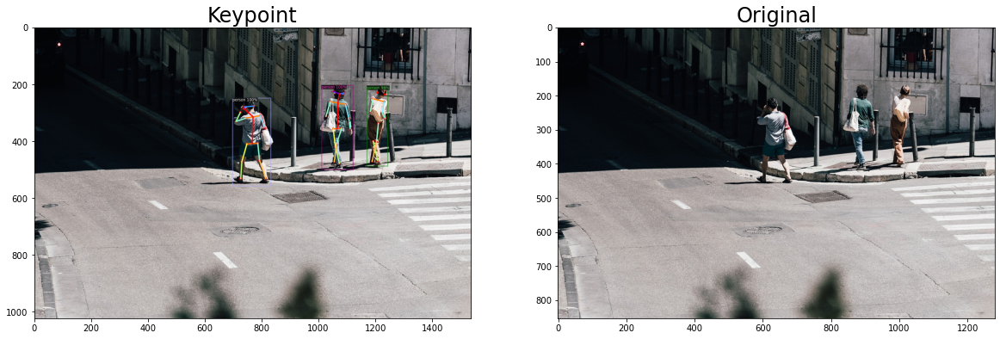

In [13]:
cfg = get_cfg()   # fresh config
cfg.merge_from_file(model_zoo.get_config_file("COCO-Keypoints/keypoint_rcnn_R_50_FPN_3x.yaml"))  
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7  # set threshold for this model
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Keypoints/keypoint_rcnn_R_50_FPN_3x.yaml")
predictor = DefaultPredictor(cfg)
outputs = predictor(im_key)                                                                        ###############
v = Visualizer(im_key[:,:,::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)            ################
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))



fig, arr = plt.subplots(1, 2, figsize=(20, 8))
arr[0].imshow(out.get_image()[:, :, ::-1][..., ::-1])
arr[0].set_title('Keypoint',fontsize=24)

arr[1].imshow(im_key[..., ::-1])                                                    #####################
arr[1].set_title('Original',fontsize=24)

Text(0.5, 1.0, 'Original')

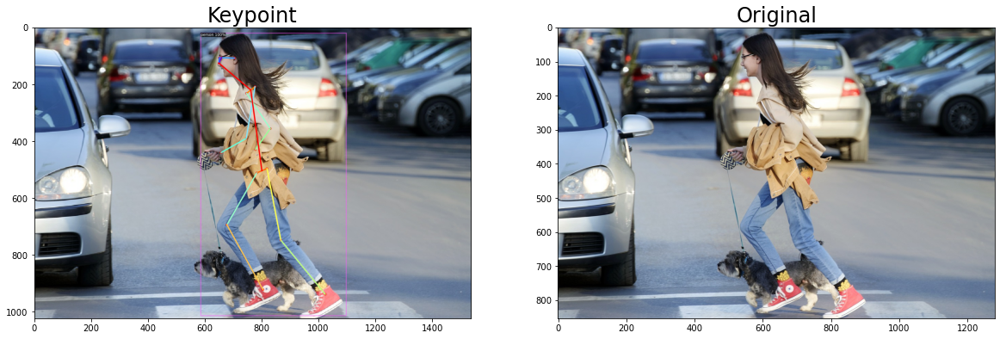

In [14]:
im_key = cv2.imread("/kaggle/input/street/girl-5087960_1280.jpg")    

cfg = get_cfg()   # fresh config
cfg.merge_from_file(model_zoo.get_config_file("COCO-Keypoints/keypoint_rcnn_R_50_FPN_3x.yaml"))  
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7  # set threshold for this model
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Keypoints/keypoint_rcnn_R_50_FPN_3x.yaml")
predictor = DefaultPredictor(cfg)
outputs = predictor(im_key)                                                                        ###############
v = Visualizer(im_key[:,:,::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)            ################
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))



fig, arr = plt.subplots(1, 2, figsize=(20, 8))
arr[0].imshow(out.get_image()[:, :, ::-1][..., ::-1])
arr[0].set_title('Keypoint',fontsize=24)

arr[1].imshow(im_key[..., ::-1])                                                    #####################
arr[1].set_title('Original',fontsize=24)

<a id="panoptic" ></a>
## 6. Panoptic segmentation

In [18]:
#!wget http://images.cocodataset.org/val2017/000000282037.jpg -q -O input.jpg
im_pan = cv2.imread("/kaggle/input/lyft-udacity-challenge/dataC/dataC/CameraRGB/02_00_114.png")   ########


Text(0.5, 1.0, 'Original')

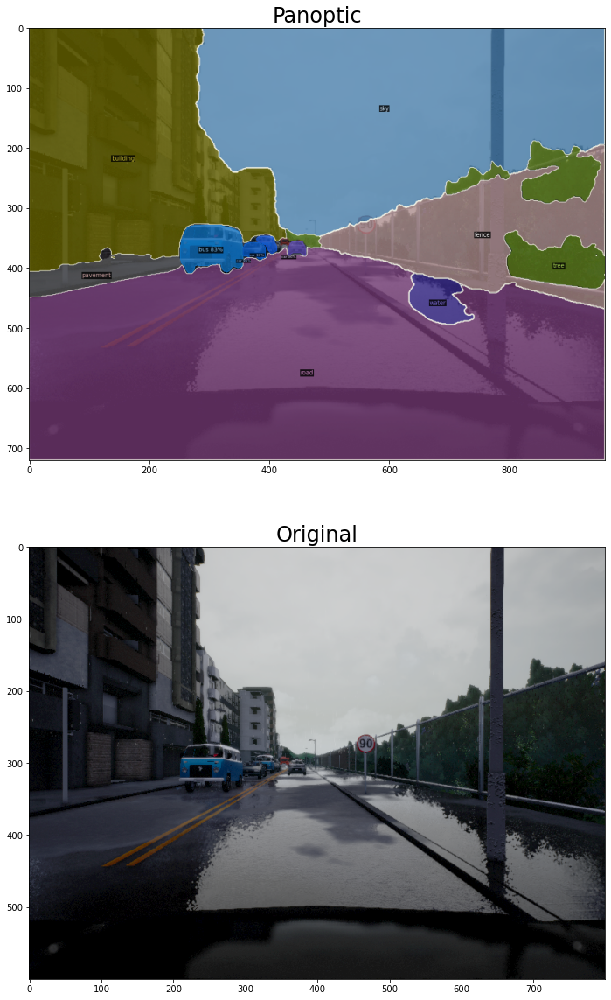

In [19]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml"))
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml")
predictor = DefaultPredictor(cfg)
panoptic_seg, segments_info = predictor(im_pan)["panoptic_seg"]                             ##########
v = Visualizer(im_pan[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)   ##########
out = v.draw_panoptic_seg_predictions(panoptic_seg.to("cpu"), segments_info)


fig, arr = plt.subplots(2, 1, figsize=(30, 20))
arr[0].imshow(out.get_image()[:, :, ::-1][..., ::-1])
arr[0].set_title('Panoptic',fontsize=24)

arr[1].imshow(im_pan[..., ::-1])                   ############
arr[1].set_title('Original',fontsize=24)

Text(0.5, 1.0, 'Original')

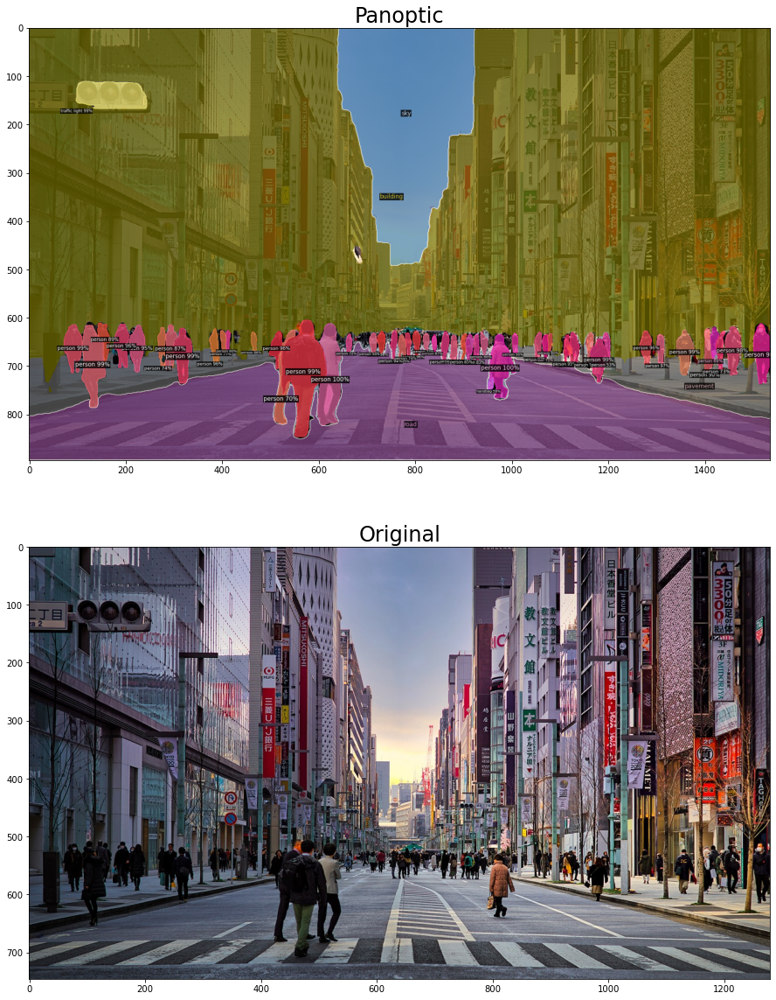

In [20]:
im_pan = cv2.imread("/kaggle/input/street/buildings-5655593_1280.jpg")   ########

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml"))
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml")
predictor = DefaultPredictor(cfg)
panoptic_seg, segments_info = predictor(im_pan)["panoptic_seg"]                             ##########
v = Visualizer(im_pan[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)   ##########
out = v.draw_panoptic_seg_predictions(panoptic_seg.to("cpu"), segments_info)


fig, arr = plt.subplots(2, 1, figsize=(30, 20))
arr[0].imshow(out.get_image()[:, :, ::-1][..., ::-1])
arr[0].set_title('Panoptic',fontsize=24)

arr[1].imshow(im_pan[..., ::-1])                   ############
arr[1].set_title('Original',fontsize=24)



# 7. YOLO

In [21]:
import time
labels = open('../input/yolo-coco-data/coco.names').read().strip().split('\n') 
# Defining paths to the weights and configuration file with model of Neural Network
weights_path = '../input/yolo-coco-data/yolov3.weights'
configuration_path = '../input/yolo-coco-data/yolov3.cfg'

# Setting minimum probability to eliminate weak predictions
probability_minimum = 0.5

# Setting threshold for non maximum suppression
threshold = 0.3

network = cv2.dnn.readNetFromDarknet(configuration_path, weights_path)

# Getting names of all layers
layers_names_all = network.getLayerNames()  # list of layers' names

# # Check point
print(layers_names_all)

['conv_0', 'bn_0', 'leaky_1', 'conv_1', 'bn_1', 'leaky_2', 'conv_2', 'bn_2', 'leaky_3', 'conv_3', 'bn_3', 'leaky_4', 'shortcut_4', 'conv_5', 'bn_5', 'leaky_6', 'conv_6', 'bn_6', 'leaky_7', 'conv_7', 'bn_7', 'leaky_8', 'shortcut_8', 'conv_9', 'bn_9', 'leaky_10', 'conv_10', 'bn_10', 'leaky_11', 'shortcut_11', 'conv_12', 'bn_12', 'leaky_13', 'conv_13', 'bn_13', 'leaky_14', 'conv_14', 'bn_14', 'leaky_15', 'shortcut_15', 'conv_16', 'bn_16', 'leaky_17', 'conv_17', 'bn_17', 'leaky_18', 'shortcut_18', 'conv_19', 'bn_19', 'leaky_20', 'conv_20', 'bn_20', 'leaky_21', 'shortcut_21', 'conv_22', 'bn_22', 'leaky_23', 'conv_23', 'bn_23', 'leaky_24', 'shortcut_24', 'conv_25', 'bn_25', 'leaky_26', 'conv_26', 'bn_26', 'leaky_27', 'shortcut_27', 'conv_28', 'bn_28', 'leaky_29', 'conv_29', 'bn_29', 'leaky_30', 'shortcut_30', 'conv_31', 'bn_31', 'leaky_32', 'conv_32', 'bn_32', 'leaky_33', 'shortcut_33', 'conv_34', 'bn_34', 'leaky_35', 'conv_35', 'bn_35', 'leaky_36', 'shortcut_36', 'conv_37', 'bn_37', 'leaky_

In [22]:
# Getting only output layers' names that we need from YOLO algorithm
layers_names_output = [layers_names_all[i[0] - 1] for i in network.getUnconnectedOutLayers()]  # list of layers' names

# Check point
print(layers_names_output)  # ['yolo_82', 'yolo_94', 'yolo_106']

['yolo_82', 'yolo_94', 'yolo_106']


# Preview 

(600, 800, 3)


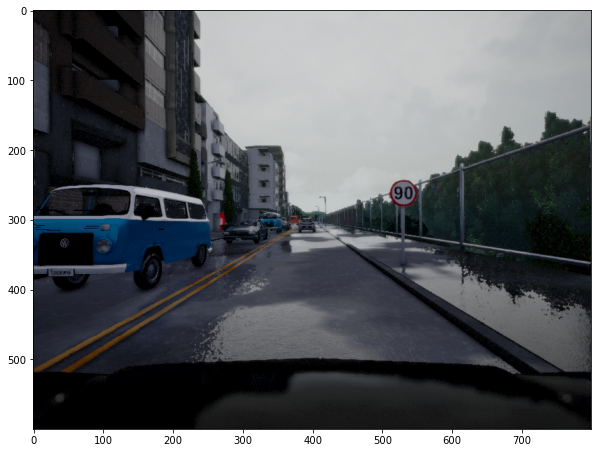

In [34]:
# Our image initially is in RGB format
# But now we open it in BGR format as function 'cv2.imread' opens it so
image_input = cv2.imread('/kaggle/input/lyft-udacity-challenge/dataA/dataA/CameraRGB/02_00_120.png')

# Getting image shape
image_input_shape = image_input.shape

# Check point
print(image_input_shape)  # tuple of (917, 1222, 3)
plt.rcParams['figure.figsize'] = (10.0, 10.0)
plt.imshow(cv2.cvtColor(image_input, cv2.COLOR_BGR2RGB))
plt.show()

# Blob

(600, 800, 3)
(1, 3, 416, 416)
(416, 416, 3)


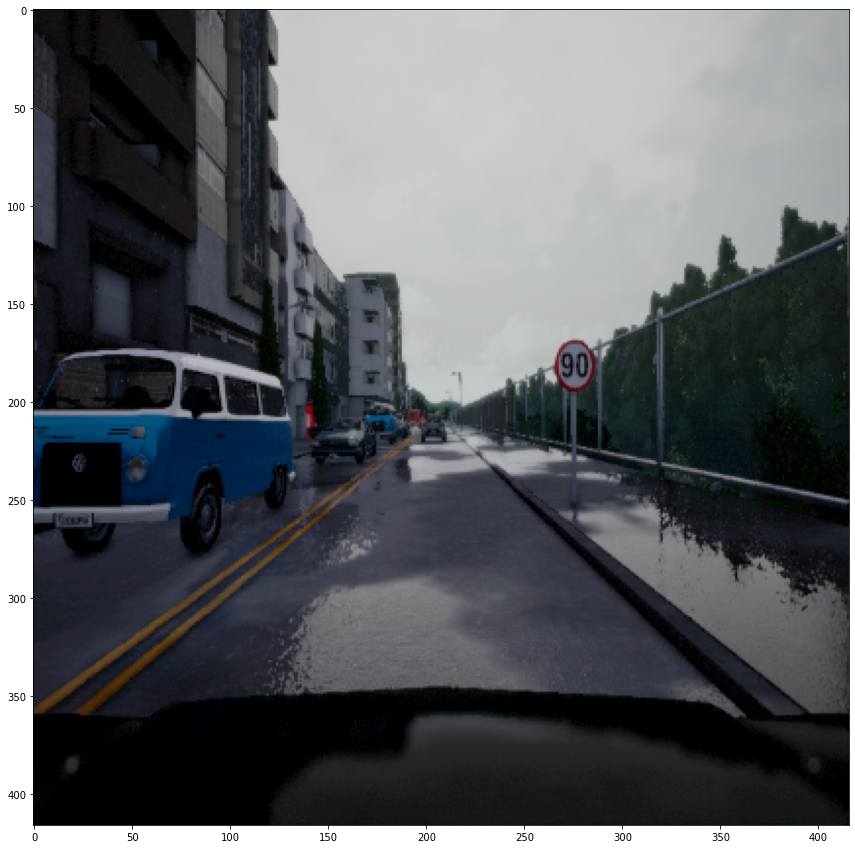

In [35]:
# The 'cv2.dnn.blobFromImage' function returns 4-dimensional blob
# from input image after mean subtraction, normalizing, and RB channels swapping
# Resulted shape has number of images, number of channels, width and height
# E.G.: blob = cv2.dnn.blobFromImage(image, scalefactor=1.0, size, mean, swapRB=True)
# Link: https://www.pyimagesearch.com/2017/11/06/deep-learning-opencvs-blobfromimage-works/
blob = cv2.dnn.blobFromImage(image_input, 1 / 255.0, (416, 416), swapRB=True, crop=False)

# Check point
print(image_input.shape)  # (917, 1222, 3)
print(blob.shape)  # (1, 3, 416, 416)

# Check point
# Slicing blob and transposing to make channels come at the end
blob_to_show = blob[0, :, :, :].transpose(1, 2, 0)
print(blob_to_show.shape)  # (416, 416, 3)

# Showing 'blob_to_show'
%matplotlib inline
plt.rcParams['figure.figsize'] = (15.0, 15.0)
plt.imshow(blob_to_show)
plt.show()

# Forward Pass and colors

In [36]:
# Calculating at the same time, needed time for forward pass
network.setInput(blob)  # setting blob as input to the network
start = time.time()
output_from_network = network.forward(layers_names_output)
end = time.time()

# Showing spent time for forward pass
print('YOLO v3 took {:.5f} seconds'.format(end - start))

# Check point
print(type(output_from_network))  # <class 'list'>
print(type(output_from_network[0]))  # <class 'numpy.ndarray'>

# Seed the generator - every time we run the code it will generate by the same rules
# In this way we can keep specific colour the same for every class
np.random.seed(42)
# randint(low, high=None, size=None, dtype='l')
colours = np.random.randint(0, 255, size=(len(labels), 3), dtype='uint8')

# Check point
print(colours.shape)  # (80, 3)
print(colours[0])  # [102 220 225]

YOLO v3 took 1.32466 seconds
<class 'list'>
<class 'numpy.ndarray'>
(80, 3)
[102 220 225]


# bounding_boxes, confidences, probability_minimum, threshold

In [37]:
# Preparing lists for detected bounding boxes, obtained confidences and class's number
bounding_boxes = []
confidences = []
class_numbers = []

# Getting spacial dimension of input image
h, w = image_input_shape[:2]  # Slicing from tuple only first two elements

# Check point
print(h, w)  # 917 1222

for result in output_from_network:
    # Going through all detections from current output layer
    for detection in result:
        # Getting class for current object
        scores = detection[5:]
        class_current = np.argmax(scores)

        # Getting confidence (probability) for current object
        confidence_current = scores[class_current]

        # Eliminating weak predictions by minimum probability
        if confidence_current > probability_minimum:
            # Scaling bounding box coordinates to the initial image size
            # YOLO data format keeps center of detected box and its width and height
            # That is why we can just elementwise multiply them to the width and height of the image
            box_current = detection[0:4] * np.array([w, h, w, h])

            # From current box with YOLO format getting top left corner coordinates
            # that are x_min and y_min
            x_center, y_center, box_width, box_height = box_current.astype('int')
            x_min = int(x_center - (box_width / 2))
            y_min = int(y_center - (box_height / 2))

            # Adding results into prepared lists
            bounding_boxes.append([x_min, y_min, int(box_width), int(box_height)])
            confidences.append(float(confidence_current))
            class_numbers.append(class_current)
            
            
# It is needed to make sure the data type of the boxes is 'int'
# and the type of the confidences is 'float'
# https://github.com/opencv/opencv/issues/12789
results = cv2.dnn.NMSBoxes(bounding_boxes, confidences, probability_minimum, threshold)

# Check point
# Showing labels of the detected objects
for i in range(len(class_numbers)):
    print(labels[int(class_numbers[i])])

# Saving found labels
with open('found_labels.txt', 'w') as f:
    for i in range(len(class_numbers)):
        f.write(labels[int(class_numbers[i])])
        
        
# Checking if there is at least one detected object
if len(results) > 0:
    # Going through indexes of results
    for i in results.flatten():
        # Getting current bounding box coordinates
        x_min, y_min = bounding_boxes[i][0], bounding_boxes[i][1]
        box_width, box_height = bounding_boxes[i][2], bounding_boxes[i][3]

        # Preparing colour for current bounding box
        colour_box_current = [int(j) for j in colours[class_numbers[i]]]

        # Drawing bounding box on the original image
        cv2.rectangle(image_input, (x_min, y_min), (x_min + box_width, y_min + box_height),
                      colour_box_current, 5)

        # Preparing text with label and confidence for current bounding box
        text_box_current = '{}: {:.4f}'.format(labels[int(class_numbers[i])], confidences[i])

        # Putting text with label and confidence on the original image
        cv2.putText(image_input, text_box_current, (x_min, y_min - 7), cv2.FONT_HERSHEY_SIMPLEX,
                    1.5, colour_box_current, 5)

600 800
car
car
car
car
stop sign
car
car
car


# Plot

Text(0.5, 1.0, 'Original')

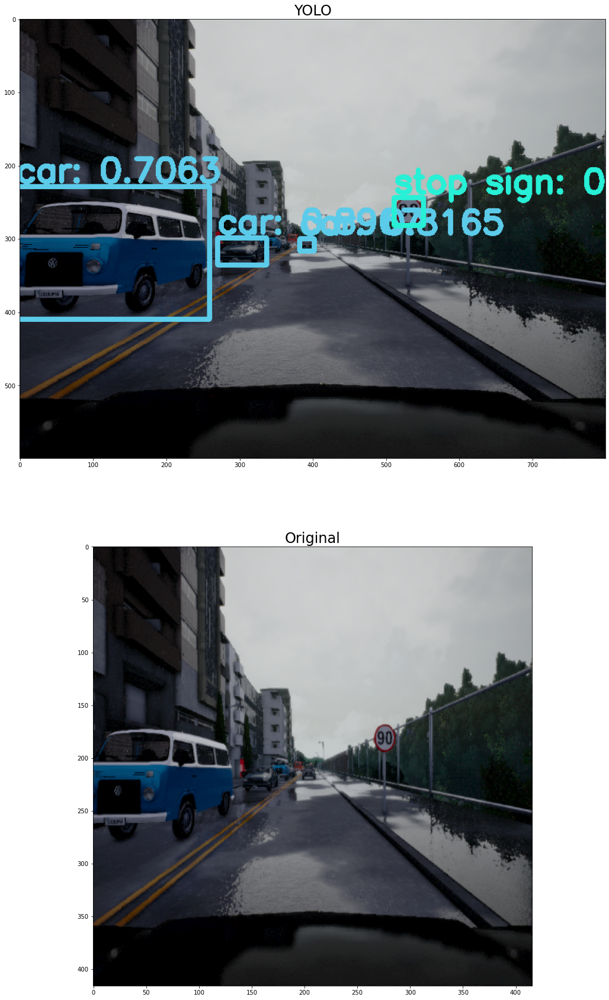

In [38]:
%matplotlib inline

fig, arr = plt.subplots(2, 1, figsize=(20, 30))

arr[0].imshow(cv2.cvtColor(image_input, cv2.COLOR_BGR2RGB))
arr[0].set_title('YOLO',fontsize=24)

arr[1].imshow(blob_to_show)
arr[1].set_title('Original',fontsize=24)

Text(0.5, 1.0, 'Original')

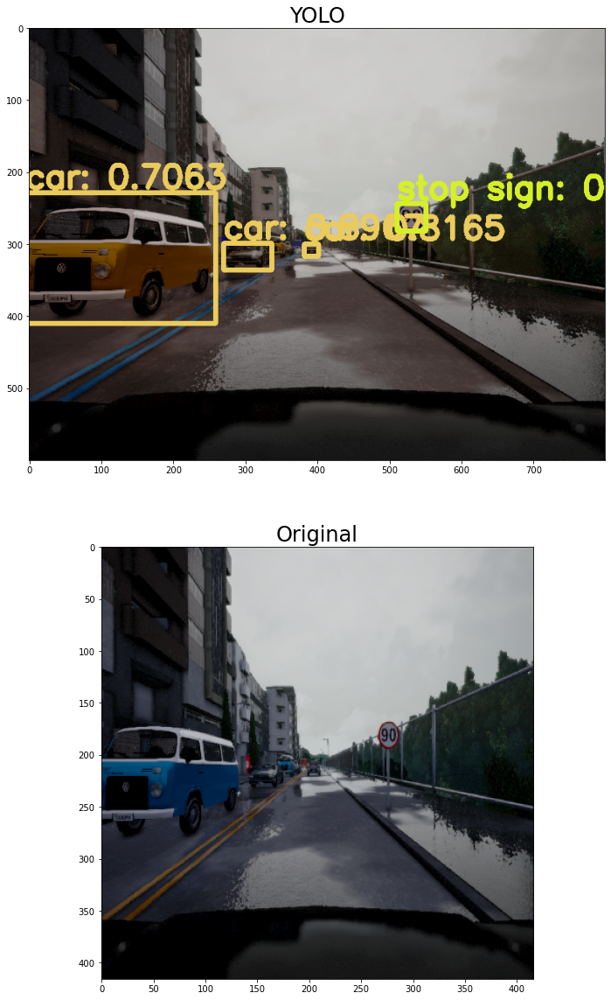

In [39]:
%matplotlib inline

fig, arr = plt.subplots(2, 1, figsize=(20, 20))

arr[0].imshow(image_input)
arr[0].set_title('YOLO',fontsize=24)

arr[1].imshow(blob_to_show)
arr[1].set_title('Original',fontsize=24)

# YOLO for another image

(853, 1280, 3)
(853, 1280, 3)
(1, 3, 416, 416)
(416, 416, 3)
YOLO v3 took 2.07920 seconds
<class 'list'>
<class 'numpy.ndarray'>
(80, 3)
[102 220 225]
853 1280
car
car
car
car
car
car
car
car
car
car
car
person
person
car
person
person
car
dog
dog
car
car
car
car
car
car
car
car


Text(0.5, 1.0, 'Original')

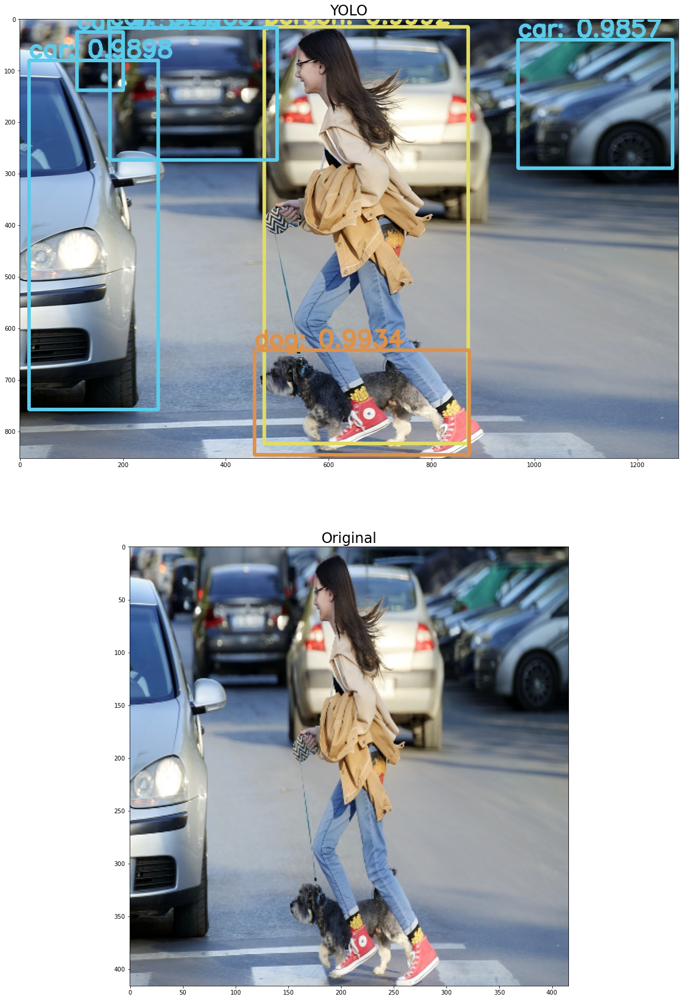

In [40]:
image_input = cv2.imread('/kaggle/input/street/girl-5087960_1280.jpg')

# Getting image shape
image_input_shape = image_input.shape

# Check point
print(image_input_shape)  

blob = cv2.dnn.blobFromImage(image_input, 1 / 255.0, (416, 416), swapRB=True, crop=False)

# Check point
print(image_input.shape)  # (917, 1222, 3)
print(blob.shape)  # (1, 3, 416, 416)

# Check point
# Slicing blob and transposing to make channels come at the end
blob_to_show = blob[0, :, :, :].transpose(1, 2, 0)
print(blob_to_show.shape)  # (416, 416, 3)

network.setInput(blob)  # setting blob as input to the network
start = time.time()
output_from_network = network.forward(layers_names_output)
end = time.time()

# Showing spent time for forward pass
print('YOLO v3 took {:.5f} seconds'.format(end - start))

# Check point
print(type(output_from_network))  # <class 'list'>
print(type(output_from_network[0]))  # <class 'numpy.ndarray'>

# Seed the generator - every time we run the code it will generate by the same rules
# In this way we can keep specific colour the same for every class
np.random.seed(42)
# randint(low, high=None, size=None, dtype='l')
colours = np.random.randint(0, 255, size=(len(labels), 3), dtype='uint8')

# Check point
print(colours.shape)  # (80, 3)
print(colours[0])  # [102 220 225]

# Preparing lists for detected bounding boxes, obtained confidences and class's number
bounding_boxes = []
confidences = []
class_numbers = []

# Getting spacial dimension of input image
h, w = image_input_shape[:2]  # Slicing from tuple only first two elements

# Check point
print(h, w)  # 917 1222

for result in output_from_network:
    # Going through all detections from current output layer
    for detection in result:
        # Getting class for current object
        scores = detection[5:]
        class_current = np.argmax(scores)

        # Getting confidence (probability) for current object
        confidence_current = scores[class_current]

        # Eliminating weak predictions by minimum probability
        if confidence_current > probability_minimum:
            # Scaling bounding box coordinates to the initial image size
            # YOLO data format keeps center of detected box and its width and height
            # That is why we can just elementwise multiply them to the width and height of the image
            box_current = detection[0:4] * np.array([w, h, w, h])

            # From current box with YOLO format getting top left corner coordinates
            # that are x_min and y_min
            x_center, y_center, box_width, box_height = box_current.astype('int')
            x_min = int(x_center - (box_width / 2))
            y_min = int(y_center - (box_height / 2))

            # Adding results into prepared lists
            bounding_boxes.append([x_min, y_min, int(box_width), int(box_height)])
            confidences.append(float(confidence_current))
            class_numbers.append(class_current)
            
            
# It is needed to make sure the data type of the boxes is 'int'
# and the type of the confidences is 'float'
# https://github.com/opencv/opencv/issues/12789
results = cv2.dnn.NMSBoxes(bounding_boxes, confidences, probability_minimum, threshold)

# Check point
# Showing labels of the detected objects
for i in range(len(class_numbers)):
    print(labels[int(class_numbers[i])])

# Saving found labels
with open('found_labels.txt', 'w') as f:
    for i in range(len(class_numbers)):
        f.write(labels[int(class_numbers[i])])
        
        
# Checking if there is at least one detected object
if len(results) > 0:
    # Going through indexes of results
    for i in results.flatten():
        # Getting current bounding box coordinates
        x_min, y_min = bounding_boxes[i][0], bounding_boxes[i][1]
        box_width, box_height = bounding_boxes[i][2], bounding_boxes[i][3]

        # Preparing colour for current bounding box
        colour_box_current = [int(j) for j in colours[class_numbers[i]]]

        # Drawing bounding box on the original image
        cv2.rectangle(image_input, (x_min, y_min), (x_min + box_width, y_min + box_height),
                      colour_box_current, 5)

        # Preparing text with label and confidence for current bounding box
        text_box_current = '{}: {:.4f}'.format(labels[int(class_numbers[i])], confidences[i])

        # Putting text with label and confidence on the original image
        cv2.putText(image_input, text_box_current, (x_min, y_min - 7), cv2.FONT_HERSHEY_SIMPLEX,
                    1.5, colour_box_current, 5)
        

%matplotlib inline

fig, arr = plt.subplots(2, 1, figsize=(20, 30))

arr[0].imshow(cv2.cvtColor(image_input, cv2.COLOR_BGR2RGB))
arr[0].set_title('YOLO',fontsize=24)

arr[1].imshow(blob_to_show)
arr[1].set_title('Original',fontsize=24)


# References:

https://www.kaggle.com/code/awsaf49/great-barrier-reef-yolov5-infer
https://www.kaggle.com/code/valentynsichkar/yolo-v3-with-opencv

https://www.kaggle.com/code/ultralytics/yolov5
https://www.kaggle.com/code/balraj98/yolo-v5-car-object-detection

https://www.kaggle.com/code/aruchomu/yolo-v3-object-detection-in-tensorflow

https://www.kaggle.com/code/stpeteishii/animal-detection-by-yolo-coco-model

https://www.kaggle.com/code/pallavisinha12/object-detection

https://www.kaggle.com/code/valentynsichkar/yolo-v3-with-opencv  !!!




https://www.kaggle.com/code/maartenvandevelde/object-detection-with-detectron2-pytorch !!!

https://www.kaggle.com/code/julienbeaulieu/imaterialist-detectron2

https://www.kaggle.com/code/lplenka/detectron2-car-damage-detection

https://www.kaggle.com/code/dhiiyaur/detectron-2-face-detection

https://www.kaggle.com/code/ammarnassanalhajali/sartorius-segmentation-detectron2-inference

https://www.kaggle.com/code/dhiiyaur/detectron-2-compare-models-augmentation

https://www.kaggle.com/code/slawekbiel/positive-score-with-detectron-3-3-inference